In [1]:
# Machine learning libraries
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
import seaborn as sns
from sklearn import linear_model, metrics

# Technical Indicators
# import talib as ta

# Plotting graphs
import matplotlib.pyplot as plt

# Machine learning
from sklearn import metrics
from sklearn.model_selection import cross_val_score

from sklearn.linear_model import LogisticRegression
# Data fetching
from pandas_datareader import data as pdr
import yfinance as yf
yf.pdr_override()
import pickle
#date and time
import datetime as dt
current_date = dt.datetime.now()

# Data Manipulation
import numpy as np
import pandas as pd

In [3]:
# Read the data
# Df = yf.download('^NSEI', '2012-12-31', current_date, auto_adjust=True)
# Df2 = yf.download('SPY', '2012-12-31', current_date, auto_adjust=True)
# Df3 = yf.download('^IRX', '2012-12-31', current_date, auto_adjust=True)

# Df.info()

ticker = 'AAPL'
exchange = ''

Data_for_Portfolio_TOTAL = pd.DataFrame()

with open(f'''C:/Users/Anton/Desktop/Backtesting/BANKA/data_json_{ticker.replace(exchange, '')}.pickle''',  # УКАЗАТЬ СВОЙ ПУТЬ !!!!
          'rb') as f:
    data_json = pickle.load(f)

with open(
        f'''C:/Users/Anton/Desktop/Backtesting/BANKA/data_json_keyratios_{ticker.replace(exchange, '')}.pickle''',  # УКАЗАТЬ СВОЙ ПУТЬ !!!!
        'rb') as f:
    data_json_keyratios = pickle.load(f)

#     print(data_json)
try:
    date_list = pd.Series(data_json['financials']['annuals']['Fiscal Year'])
    keyratios = pd.DataFrame(data_json_keyratios['Fundamental'], index=[0])
    income_df = pd.DataFrame(data_json['financials']['annuals']['income_statement']).set_index(
        date_list).replace('No Debt', 0).replace('At Loss', 0).replace('-', 0).replace('', 0).replace('N/A',
                                                                                                      0).astype(
        float)
    balance_df = pd.DataFrame(data_json['financials']['annuals']['balance_sheet']).set_index(date_list).replace(
        'No Debt', 0).replace('At Loss', 0).replace('', 0).replace('-', 0).replace('N/A', 0).astype(float)
    cashflow_df = pd.DataFrame(data_json['financials']['annuals']['cashflow_statement']).set_index(
        date_list).replace('No Debt', 0).replace('At Loss', 0).replace('', 0).replace('-', 0).replace('N/A',
                                                                                                      0).astype(
        float)
    valuation_ratios_df = pd.DataFrame(data_json['financials']['annuals']['valuation_ratios']).set_index(
        date_list).replace('No Debt', 0).replace('At Loss', 0).replace('', 0).replace('-', 0).replace('N/A',
                                                                                                      0).astype(
        float)
    valuation_and_quality_df = pd.DataFrame(
        data_json['financials']['annuals']['valuation_and_quality']).set_index(date_list).drop(
        ['Restated Filing Date', 'Filing Date', 'Earnings Release Date'], axis=1).replace('', 0).replace(
        'No Debt', 0).replace('At Loss', 0).replace('-', 0).replace('N/A', 0).astype(float)
    common_size_ratios_df = pd.DataFrame(data_json['financials']['annuals']['common_size_ratios']).set_index(
        date_list).replace('No Debt', 0).replace('At Loss', 0).replace('', 0).replace('-', 0).replace('N/A',
                                                                                                      0).replace(
        'Negative Tangible Equity', 0).astype(float)
    # per_share_data_array_df = pd.DataFrame(data_json['financials']['annuals']['per_share_data_array']).set_index(date_list).replace('-', 0).replace('N/A', 0).astype(float)
    per_share_data_df = pd.DataFrame(data_json['financials']['annuals']['per_share_data_array']).set_index(
        date_list).replace('', 0).replace('No Debt', 0).replace('-', 0).replace('N/A', 0).astype(float)

    check = 1
except:
    check = 0
    # print('Data error')
    pass

In [3]:
# keyratios.columns.tolist()
income_df.columns.tolist()
balance_df.columns.tolist()
# cashflow_df.columns.tolist()
# valuation_ratios_df.columns.tolist()
# valuation_and_quality_df.columns.tolist()
# common_size_ratios_df.columns.tolist()
# per_share_data_df.columns.tolist()
# pd.merge(per_share_data_df, common_size_ratios_df)
DF_corr = pd.concat([per_share_data_df, common_size_ratios_df, valuation_and_quality_df, valuation_ratios_df, cashflow_df, balance_df, \
           income_df],axis=1, ignore_index=False)
 

<AxesSubplot:>

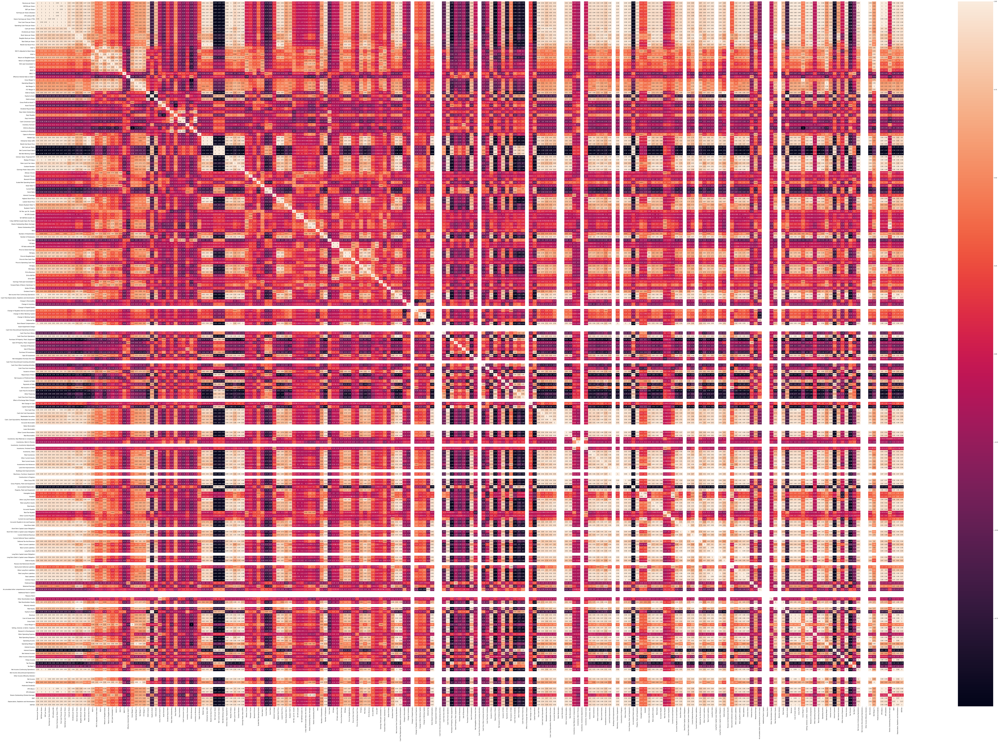

In [4]:
cov_matrix = DF_corr.cov()
corr_matrix = DF_corr.corr()
plt.figure(figsize=(150, 100))
sns.heatmap(DF_corr.corr(), annot=True)

# фичи

In [5]:
# Calculate 3-day moving average of close prices
Df['S_3'] = Df['Close'].shift(1).rolling(window=3).mean()

# Calculate 15-day moving average of close prices
Df['S_15'] = Df['Close'].shift(1).rolling(window=15).mean()

# Calculate 60-day moving average of close prices
Df['S_60'] = Df['Close'].shift(1).rolling(window=60).mean()

# Calculate the correlation between close price and 3 day moving average
Df['Corr'] = Df['Close'].shift(1).rolling(window=10).corr(Df['S_3'].shift(1))

Df['Close_Y'] = Df['Close']
# Df['Std_D'] = Df['Open']-Df['Low']

Df['OD'] = Df['Open']-Df['Open'].shift(1)
Df['OL'] = Df['Open']-Df['Close'].shift(1)
# 
Df['SPY'] = Df2['Close'] 

Df['Treasury'] = Df3['Close'] 



NameError: name 'Df' is not defined

In [ ]:
X = Df[['Open', 'S_3', 'S_15', 'S_60', 'OD', 'OL', 'Corr', 'SPY', 'Treasury']]
# X = Df[['SPY']]


In [ ]:
yU = Df['Close_Y']

In [ ]:
imp = SimpleImputer(missing_values = np.nan, strategy='most_frequent')
steps = [('imputation', imp),
         ('scaler',StandardScaler()),
         ('linear',LinearRegression())]     
pipeline = Pipeline(steps)

In [ ]:
parameters = {'linear__fit_intercept':[0,1]}

In [ ]:
reg = GridSearchCV(pipeline, parameters, cv=5)

In [ ]:
t = .7
split = int(t*len(Df))
reg.fit(X[:split],yU[:split])

In [ ]:
best_fit = reg.best_params_['linear__fit_intercept']
best_fit

In [ ]:
reg = LinearRegression(fit_intercept=best_fit)

In [ ]:
X = imp.fit_transform(X,yU)

In [ ]:
reg.fit(X[:split], yU[:split])
y_predict = reg.predict(X)

# Assign the predicted values to a new column in the dataframe
Df.reset_index(inplace=True)

Df['Predict close'] = y_predict
# Df.loc[Df['Predict close'] < 0, 'Predict close'] = 0

In [ ]:
Df.info()

In [ ]:


Df['Predict close'][split:].plot(figsize=(10, 5))
Df['Close'][split:].plot(figsize=(10, 5))
plt.ylabel("Close Price")
plt.show()

# Логистическая регрессия


In [ ]:
df = pdr.get_data_yahoo('^NSEI', '2012-12-31', current_date)
df = df.fillna(method='backfill')
df = df.iloc[:,:4]
df.info()

In [ ]:
df['S_3'] = df['Close'].rolling(window=3).mean()
df['S_10'] = df['Close'].rolling(window=10).mean()

df['Corr'] = df['Close'].rolling(window=10).corr(df['S_3'])

df['RSI'] = ta.RSI(np.array(df['Close']), timeperiod =10)
df['Open-Close'] = df['Open'] - df['Close'].shift(1)
df['Open-Open'] = df['Open'] - df['Open'].shift(1)
df = df.fillna(method='backfill')
X = df.iloc[:,:9]
X



# X = Df[['Open', 'S_3', 'S_15', 'S_60', 'OD', 'OL', 'Corr', 'SPY', 'Treasury']]


In [ ]:
cov_matrix = df.cov()
corr_matrix = df.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(df.corr(), annot=True)

In [ ]:
y = np.where(df['Close'].shift(-1) > df['Close'],1,-1)

In [ ]:
split = int(0.7*len(df))
X_train, X_test, y_train, y_test = X[:split], X[split:], y[:split], y[split:]
X_train.fillna(method='backfill')

In [ ]:
model = LogisticRegression()
model = model.fit (X_train,y_train)

probability = model.predict_proba(X_test)
print(probability)

In [ ]:
predicted = model.predict(X_test)

In [ ]:
print(metrics.classification_report(y_test, predicted))

In [ ]:
cross_val = cross_val_score(LogisticRegression(), X, y, scoring='accuracy', cv=10)


In [ ]:
# Df['Predict close']
# df['Close'] = Df['Predict close'].tolist()
# df['Close']

In [ ]:
Df['Predict close'][split:]

In [ ]:

# df['Close'][split:] = Df['Predict close'][split:].tolist() 

# df['Open'][-1] = Df['Predict close'].tolist()[-1] 

X2 = df[['Open', 'High', 'Low', 'Close', 'S_10', 'Corr', 'RSI', 'Open-Close', 'Open-Open']]
X2[split:]

In [ ]:

df['Predicted_Signal'] = model.predict(X)
df['Nifty_returns'] = np.log(df['Close']/df['Close'].shift(1))
Cumulative_Nifty_returns = np.cumsum(df[split:]['Nifty_returns'])

df['Startegy_returns'] = df['Nifty_returns']* df['Predicted_Signal'].shift(1)
Cumulative_Strategy_returns = np.cumsum(df[split:]['Startegy_returns'])

plt.figure(figsize=(10,5))
plt.plot(Cumulative_Nifty_returns, color='r',label = 'Nifty Returns')
plt.plot(Cumulative_Strategy_returns, color='g', label = 'Strategy Returns')
plt.legend()
plt.show()
df['Predicted_Signal'][::-1].head(50)
df['Nifty_returns']

In [ ]:
 df_res['Predicted_Signal'] 

In [ ]:
df[split:]['Nifty_returns']

In [ ]:
df[split:]['Nifty_returns'].values